In [1]:
#collect all time points for one cancer type and perform clustering analysis

# libraries

In [2]:
import patientClassFunctions as ptfn
import numpy as np
import pandas as pd
import matplotlib as mpl
import seaborn as sns
import os
# import seaborn as sns
from sklearn.decomposition import PCA
import umap
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from sklearn.neighbors import NearestNeighbors
import networkx as nx
from scipy import sparse
from community import community_louvain
import community
from collections import defaultdict
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.metrics import mutual_info_score, adjusted_rand_score

# directory management

In [4]:
computer_path_header = "C:\\Users\\maega"
# computer_path_header = "C:\\Users\\mcremer"
folder_path2= "UFL Dropbox\\Maegan Cremer\\BTO-data"
folder_path_processed = "012_Processed_Data"
path_ptdata = os.path.join(computer_path_header, folder_path2, folder_path_processed, "patient_files")
os.chdir(path_ptdata)

# file importing and patient class

In [5]:
#importing patient data as dictionaries of dataframes

#build a dictionary of patients and their values 
ptFiles = ptfn.GetListofPTfiles(path_ptdata, '.xlsx', 'BTO')

ptDict = {}

#loop through the listOfPatients 
for file in ptFiles: 
    pt = ptfn.patient(path_ptdata, file, 7)
    ptDict[pt.ptID] = pt

BTO-002 no patient identifying information
BTO-051 no patient identifying information
BTO-081 no patient identifying information


# collecting the data

In [6]:
#the primary tumor type of interest
#1, Esophagogastric | 2, HCC | 3, Biliary Tract | 4, Pancreatic | 5, Colorectal | 6, Anal | 7, NET | 8, Other GI cancer
primaryOfinterest = 4 #some integer as described above

In [7]:
# test_primary = {}
methylationDict = {}

primarytumorEnrollementDict = {}

metEnrollmentDict = {}
metEnrollmentPresence = {}

NSRdict = {}

for ptID in ptDict.keys():
    ptdata = ptDict[ptID]
    if ptdata.methylationSignatures is not False and ptdata.ptDemographics is not False:
        if ptdata.primarytumor == 4:
            methylationDict[ptID] = ptdata.methylationSignatures #all time points
            primarytumorEnrollementDict[ptID]= ptdata.primarytumorEnrollment #binary if primary tumor is present at enrollment
            metEnrollmentDict[ptID] = ptdata.metEnrollmentList #numeric list of locations of mets at enrollment 
            metEnrollmentPresence[ptID] = ptdata.metsAtEnrollment #length of met sites
            NSRdict[ptID] = ptdata.NSR

print(len(methylationDict.keys()))

13


In [8]:
metEnrollmentDict


{'BTO-018': [2],
 'BTO-022': [1],
 'BTO-035': [5],
 'BTO-038': [1],
 'BTO-042': [1],
 'BTO-053': [2, 3, 6],
 'BTO-082': [1],
 'BTO-108': [1, 3, 5],
 'BTO-121': [1, 4, 5],
 'BTO-122': [1, 2, 4, 5],
 'BTO-125': [2],
 'BTO-131': [1, 2, 4, 5],
 'BTO-134': [1]}

In [9]:
metsLongDict = {}
for ptID in metEnrollmentDict.keys():
    mets = metEnrollmentDict[ptID]
    if len(mets) > 0:
        mets_new = [x if x in mets else 0 for x in range(1,7)]
    elif len(mets) == 0:
        mets_new = [0 for x in range(1,7)]
    metsLongDict[ptID] = mets_new

metsLongDict        

{'BTO-018': [0, 2, 0, 0, 0, 0],
 'BTO-022': [1, 0, 0, 0, 0, 0],
 'BTO-035': [0, 0, 0, 0, 5, 0],
 'BTO-038': [1, 0, 0, 0, 0, 0],
 'BTO-042': [1, 0, 0, 0, 0, 0],
 'BTO-053': [0, 2, 3, 0, 0, 6],
 'BTO-082': [1, 0, 0, 0, 0, 0],
 'BTO-108': [1, 0, 3, 0, 5, 0],
 'BTO-121': [1, 0, 0, 4, 5, 0],
 'BTO-122': [1, 2, 0, 4, 5, 0],
 'BTO-125': [0, 2, 0, 0, 0, 0],
 'BTO-131': [1, 2, 0, 4, 5, 0],
 'BTO-134': [1, 0, 0, 0, 0, 0]}

In [10]:
for ptID in NSRdict:
    print(ptID, len(NSRdict[ptID]))

BTO-018 4
BTO-022 7
BTO-035 12
BTO-038 9
BTO-042 5
BTO-053 3
BTO-082 1
BTO-108 5
BTO-121 2
BTO-122 4
BTO-125 19
BTO-131 6
BTO-134 8


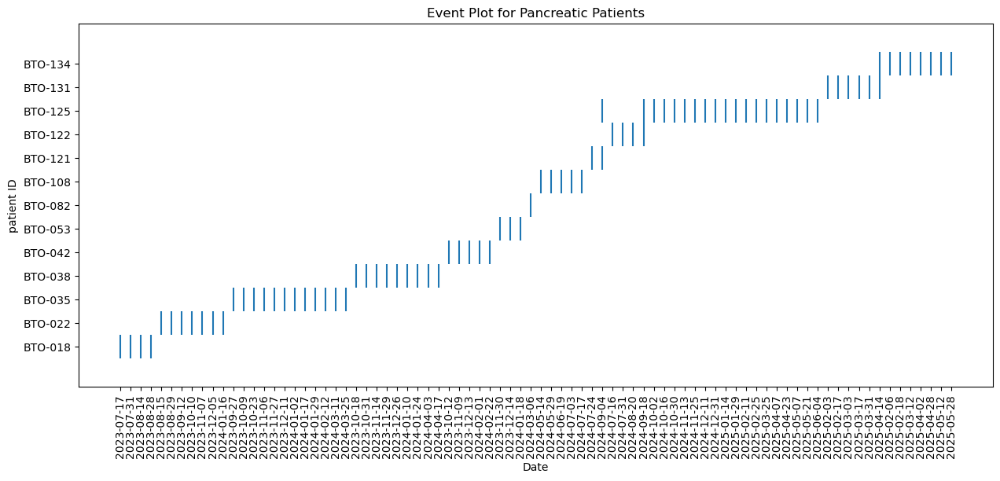

In [11]:
eventplot_data = {ptID: NSRdict[ptID]['collection_date'].values.flatten() for ptID in NSRdict}
fig, ax = plt.subplots(figsize=(15, 6))
ax.eventplot(eventplot_data.values(), lineoffsets =1)
ax.set_title('Event Plot for Pancreatic Patients')
ax.set_xlabel('Date')
ax.set_ylabel('patient ID')
#make the x-axis labels vertical
ax.tick_params(axis='x', rotation=90)
yaxislabels = [ptID for ptID in eventplot_data.keys()]
ax.set_yticks(np.arange(0, len(yaxislabels), 1), yaxislabels, rotation = 'horizontal')
plt.show()

In [12]:
methylationDict

{'BTO-018':      Unnamed: 0  10_q24.2_1  8_q21.3_1  1_p13.3_1  10_q22.1_1  11_q25_1  \
 0  NS1035CR0041           0   0.550604          0           0         0   
 1  NS1035CR0015           0   0.000000          0           0         0   
 2  NS1035CR0024           0   0.000000          0           0         0   
 
    12_q24.33_1  15_q21.1_1  15_q26.3_1  16_p13.3_2  ...  8_q24.22_12  \
 0            0           0    0.000000           0  ...     0.028705   
 1            0           0   -0.004043           0  ...    -0.002143   
 2            0           0    0.000000           0  ...    -0.002964   
 
    21_q22.11_7  7_q21.3_29  10_q26.13_9  12_q24.33_12  6_p12.1_21  \
 0    -0.003141   -0.002586    -0.002587      0.912286    0.394521   
 1    -0.002091   -0.002346     0.008406     -0.002330   -0.000081   
 2     0.230530    0.060224    -0.000080      0.331812    1.813061   
 
    17_p11.2_20    2_q14.2_22  2_q31.1_39        date  
 0     0.005976  8.212875e-02    0.473848  2023-07-

In [13]:
len(methylationDict['BTO-018'])

3

In [14]:
#concatinate the time points, hold the patient identifiers and time in another dataframe
methylationPatternsAll = False
for ptID in methylationDict.keys():
    tempDF = methylationDict[ptID]
    #add a column for the ptID
    tempDF["ptID"] = [ptID for x in range(len(tempDF))]
    if methylationPatternsAll is False: 
        methylationPatternsAll = tempDF
    elif methylationPatternsAll is not False: 
        methylationPatternsAll = pd.concat([methylationPatternsAll, tempDF])

methylationPatternsAll

,Unnamed: 0,10_q24.2_1,8_q21.3_1,1_p13.3_1,10_q22.1_1,11_q25_1,12_q24.33_1,15_q21.1_1,15_q26.3_1,16_p13.3_2,...,21_q22.11_7,7_q21.3_29,10_q26.13_9,12_q24.33_12,6_p12.1_21,17_p11.2_20,2_q14.2_22,2_q31.1_39,date,ptID
0,NS1035CR0041,0.000000,0.550604,0.000000,0,0,0.000000,0,0.000000,0.000000,...,-0.003141,-0.002586,-0.002587,0.912286,0.394521,0.005976,8.212875e-02,0.473848,2023-07-17,BTO-018
1,NS1035CR0015,0.000000,0.000000,0.000000,0,0,0.000000,0,-0.004043,0.000000,...,-0.002091,-0.002346,0.008406,-0.002330,-0.000081,-0.004085,-2.195022e-02,0.000000,2023-08-14,BTO-018
2,NS1035CR0024,0.000000,0.000000,0.000000,0,0,0.000000,0,0.000000,0.000000,...,0.230530,0.060224,-0.000080,0.331812,1.813061,0.169018,-3.819016e-08,-0.001946,2023-08-28,BTO-018
0,NS1035CR0014,0.000000,13.949957,7.376784,0,0,10.138653,0,0.000000,0.000000,...,1.089525,23.401945,3.043196,33.945545,60.102644,2.227563,1.555779e+00,3.422669,2023-08-15,BTO-022
1,NS1035CR0027,0.000000,4.865559,4.416549,0,0,4.095668,0,0.000000,-0.002327,...,0.520374,11.283355,1.083663,14.335482,27.360790,0.551449,1.042117e+00,0.904276,2023-08-29,BTO-022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,NS1035CR0629,-0.002579,0.000000,0.000000,0,0,1.017081,0,-0.005342,-0.004790,...,0.635374,1.310697,1.579426,0.811097,-0.201810,0.172293,-1.269431e-02,1.446281,2025-02-03,BTO-131
1,NS1035CR0639,-0.006379,-0.005206,0.000000,0,0,0.475896,0,-0.007255,0.337785,...,0.719100,0.155026,0.424472,-0.009069,-0.331104,-0.000002,7.723673e-01,-0.000195,2025-02-17,BTO-131
2,NS1035CR0648,-0.009916,0.514450,0.000000,0,0,1.835004,0,0.000000,-0.036770,...,0.189806,1.337344,2.956497,-0.167329,3.150814,0.013059,-1.211919e-08,-0.063649,2025-03-03,BTO-131
0,NS1035CR0631,-0.003879,0.000000,0.000000,0,0,0.000000,0,-0.007764,-0.004389,...,-0.001181,0.663322,2.280898,2.984039,4.919336,2.439459,-1.979105e-01,-0.004710,2025-02-06,BTO-134


In [15]:
#concatinate the time points, hold the patient identifiers and time in another dataframe
NSRall = False
for ptID in NSRdict.keys():
    tempDF = NSRdict[ptID]
    #add a column for the ptID
    # tempDF["ptID"] = [ptID for x in range(len(tempDF))]
    if NSRall is False: 
        NSRall = tempDF
    elif NSRall is not False: 
        NSRall = pd.concat([NSRall, tempDF])

NSRall

,Unnamed: 0,sample_name,patient_id,collection_number,collection_date,tms,nsrv2_call
0,70,NS1035CR0041,BTO-018,1,2023-07-17,65.406292,baseline
1,71,NS1035CR0009,BTO-018,2,2023-07-31,NaN,NaN
2,72,NS1035CR0015,BTO-018,3,2023-08-14,50.954419,no_change
3,73,NS1035CR0024,BTO-018,4,2023-08-28,57.559948,no_change
0,86,NS1035CR0014,BTO-022,1,2023-08-15,8379.900587,baseline
...,...,...,...,...,...,...,...
3,671,NS1035CR0660,BTO-134,4,2025-04-02,NaN,NaN
4,672,NS1035CR0664,BTO-134,5,2025-04-14,NaN,NaN
5,673,NS1035CR0716,BTO-134,6,2025-04-28,NaN,NaN
6,674,NS1035CR0712,BTO-134,7,2025-05-12,NaN,NaN


In [16]:
#then keep only the NSR that match the methylation pattern sheet
NSRnumbers = [x for x in list(methylationPatternsAll['Unnamed: 0']) if x in list(NSRall['sample_name'])]
len(NSRnumbers)

65

In [17]:
#to see how many methylation patterns are missing 
print(len(methylationPatternsAll['Unnamed: 0']))
print(len(NSRall['sample_name']))

65
85


In [18]:
methylationPatternsAll[['date', 'ptID', "Unnamed: 0"]]

,date,ptID,Unnamed: 0
0,2023-07-17,BTO-018,NS1035CR0041
1,2023-08-14,BTO-018,NS1035CR0015
2,2023-08-28,BTO-018,NS1035CR0024
0,2023-08-15,BTO-022,NS1035CR0014
1,2023-08-29,BTO-022,NS1035CR0027
...,...,...,...
0,2025-02-03,BTO-131,NS1035CR0629
1,2025-02-17,BTO-131,NS1035CR0639
2,2025-03-03,BTO-131,NS1035CR0648
0,2025-02-06,BTO-134,NS1035CR0631


In [19]:
NSRall.dropna(inplace=True) #removes the reports where there is missing information
#some more sophisticated matching may be needed to match the NSRv2 call and the methylation patterns in the future

In [20]:
#collecting the NSRv2 calls that go with each methylation pattern
NSRall.index = NSRall['sample_name']
nsrv2_calls = [NSRall.loc[x,'nsrv2_call'] for x in list(methylationPatternsAll['Unnamed: 0'])]

In [21]:
NSRall

,Unnamed: 0,sample_name,patient_id,collection_number,collection_date,tms,nsrv2_call
sample_name,,,,,,,
NS1035CR0041,70,NS1035CR0041,BTO-018,1,2023-07-17,65.406292,baseline
NS1035CR0015,72,NS1035CR0015,BTO-018,3,2023-08-14,50.954419,no_change
NS1035CR0024,73,NS1035CR0024,BTO-018,4,2023-08-28,57.559948,no_change
NS1035CR0014,86,NS1035CR0014,BTO-022,1,2023-08-15,8379.900587,baseline
NS1035CR0027,87,NS1035CR0027,BTO-022,2,2023-08-29,3730.049777,decrease
...,...,...,...,...,...,...,...
NS1035CR0629,653,NS1035CR0629,BTO-131,1,2025-02-03,472.230563,baseline
NS1035CR0639,654,NS1035CR0639,BTO-131,2,2025-02-17,346.594055,decrease
NS1035CR0648,655,NS1035CR0648,BTO-131,3,2025-03-03,327.491387,no_change


In [22]:
#collecting the TMS values
TMS = [NSRall.loc[x,'tms'] for x in list(methylationPatternsAll['Unnamed: 0'])]

In [23]:
methylationPatternsAll

,Unnamed: 0,10_q24.2_1,8_q21.3_1,1_p13.3_1,10_q22.1_1,11_q25_1,12_q24.33_1,15_q21.1_1,15_q26.3_1,16_p13.3_2,...,21_q22.11_7,7_q21.3_29,10_q26.13_9,12_q24.33_12,6_p12.1_21,17_p11.2_20,2_q14.2_22,2_q31.1_39,date,ptID
0,NS1035CR0041,0.000000,0.550604,0.000000,0,0,0.000000,0,0.000000,0.000000,...,-0.003141,-0.002586,-0.002587,0.912286,0.394521,0.005976,8.212875e-02,0.473848,2023-07-17,BTO-018
1,NS1035CR0015,0.000000,0.000000,0.000000,0,0,0.000000,0,-0.004043,0.000000,...,-0.002091,-0.002346,0.008406,-0.002330,-0.000081,-0.004085,-2.195022e-02,0.000000,2023-08-14,BTO-018
2,NS1035CR0024,0.000000,0.000000,0.000000,0,0,0.000000,0,0.000000,0.000000,...,0.230530,0.060224,-0.000080,0.331812,1.813061,0.169018,-3.819016e-08,-0.001946,2023-08-28,BTO-018
0,NS1035CR0014,0.000000,13.949957,7.376784,0,0,10.138653,0,0.000000,0.000000,...,1.089525,23.401945,3.043196,33.945545,60.102644,2.227563,1.555779e+00,3.422669,2023-08-15,BTO-022
1,NS1035CR0027,0.000000,4.865559,4.416549,0,0,4.095668,0,0.000000,-0.002327,...,0.520374,11.283355,1.083663,14.335482,27.360790,0.551449,1.042117e+00,0.904276,2023-08-29,BTO-022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,NS1035CR0629,-0.002579,0.000000,0.000000,0,0,1.017081,0,-0.005342,-0.004790,...,0.635374,1.310697,1.579426,0.811097,-0.201810,0.172293,-1.269431e-02,1.446281,2025-02-03,BTO-131
1,NS1035CR0639,-0.006379,-0.005206,0.000000,0,0,0.475896,0,-0.007255,0.337785,...,0.719100,0.155026,0.424472,-0.009069,-0.331104,-0.000002,7.723673e-01,-0.000195,2025-02-17,BTO-131
2,NS1035CR0648,-0.009916,0.514450,0.000000,0,0,1.835004,0,0.000000,-0.036770,...,0.189806,1.337344,2.956497,-0.167329,3.150814,0.013059,-1.211919e-08,-0.063649,2025-03-03,BTO-131
0,NS1035CR0631,-0.003879,0.000000,0.000000,0,0,0.000000,0,-0.007764,-0.004389,...,-0.001181,0.663322,2.280898,2.984039,4.919336,2.439459,-1.979105e-01,-0.004710,2025-02-06,BTO-134


In [24]:
#collecting the dates, patient ids, and NSR numbers so that rows of the data frame can be connected to patients later in analysis
datesIDnsr= methylationPatternsAll[['ptID', 'date', 'Unnamed: 0']] 
datesIDnsr

,ptID,date,Unnamed: 0
0,BTO-018,2023-07-17,NS1035CR0041
1,BTO-018,2023-08-14,NS1035CR0015
2,BTO-018,2023-08-28,NS1035CR0024
0,BTO-022,2023-08-15,NS1035CR0014
1,BTO-022,2023-08-29,NS1035CR0027
...,...,...,...
0,BTO-131,2025-02-03,NS1035CR0629
1,BTO-131,2025-02-17,NS1035CR0639
2,BTO-131,2025-03-03,NS1035CR0648
0,BTO-134,2025-02-06,NS1035CR0631


In [25]:
datesIDnsr['nsrv2_call'] = nsrv2_calls #adding the calls to the frame
datesIDnsr

C:\Users\maega\AppData\Local\Temp\ipykernel_8016\1522721403.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datesIDnsr['nsrv2_call'] = nsrv2_calls #adding the calls to the frame


,ptID,date,Unnamed: 0,nsrv2_call
0,BTO-018,2023-07-17,NS1035CR0041,baseline
1,BTO-018,2023-08-14,NS1035CR0015,no_change
2,BTO-018,2023-08-28,NS1035CR0024,no_change
0,BTO-022,2023-08-15,NS1035CR0014,baseline
1,BTO-022,2023-08-29,NS1035CR0027,decrease
...,...,...,...,...
0,BTO-131,2025-02-03,NS1035CR0629,baseline
1,BTO-131,2025-02-17,NS1035CR0639,decrease
2,BTO-131,2025-03-03,NS1035CR0648,no_change
0,BTO-134,2025-02-06,NS1035CR0631,baseline


In [26]:
datesIDnsr['tms'] = pd.DataFrame(TMS)
datesIDnsr

C:\Users\maega\AppData\Local\Temp\ipykernel_8016\3824144440.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datesIDnsr['tms'] = pd.DataFrame(TMS)


,ptID,date,Unnamed: 0,nsrv2_call,tms
0,BTO-018,2023-07-17,NS1035CR0041,baseline,65.406292
1,BTO-018,2023-08-14,NS1035CR0015,no_change,50.954419
2,BTO-018,2023-08-28,NS1035CR0024,no_change,57.559948
0,BTO-022,2023-08-15,NS1035CR0014,baseline,65.406292
1,BTO-022,2023-08-29,NS1035CR0027,decrease,50.954419
...,...,...,...,...,...
0,BTO-131,2025-02-03,NS1035CR0629,baseline,65.406292
1,BTO-131,2025-02-17,NS1035CR0639,decrease,50.954419
2,BTO-131,2025-03-03,NS1035CR0648,no_change,57.559948
0,BTO-134,2025-02-06,NS1035CR0631,baseline,65.406292


In [27]:
#preparing data for the standard scaler
methylationPatternsAll_clean= methylationPatternsAll.drop(["Unnamed: 0", "date", 'ptID'], axis = 1)
methylationPatternsAll_clean

,10_q24.2_1,8_q21.3_1,1_p13.3_1,10_q22.1_1,11_q25_1,12_q24.33_1,15_q21.1_1,15_q26.3_1,16_p13.3_2,16_p12.2_1,...,7_q36.3_22,8_q24.22_12,21_q22.11_7,7_q21.3_29,10_q26.13_9,12_q24.33_12,6_p12.1_21,17_p11.2_20,2_q14.2_22,2_q31.1_39
0,0.000000,0.550604,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003185,0.028705,-0.003141,-0.002586,-0.002587,0.912286,0.394521,0.005976,8.212875e-02,0.473848
1,0.000000,0.000000,0.000000,0,0,0.000000,0,-0.004043,0.000000,0.000000,...,-0.004210,-0.002143,-0.002091,-0.002346,0.008406,-0.002330,-0.000081,-0.004085,-2.195022e-02,0.000000
2,0.000000,0.000000,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003276,-0.002964,0.230530,0.060224,-0.000080,0.331812,1.813061,0.169018,-3.819016e-08,-0.001946
0,0.000000,13.949957,7.376784,0,0,10.138653,0,0.000000,0.000000,20.470285,...,0.251970,31.758502,1.089525,23.401945,3.043196,33.945545,60.102644,2.227563,1.555779e+00,3.422669
1,0.000000,4.865559,4.416549,0,0,4.095668,0,0.000000,-0.002327,11.192694,...,0.652723,11.115365,0.520374,11.283355,1.083663,14.335482,27.360790,0.551449,1.042117e+00,0.904276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,-0.002579,0.000000,0.000000,0,0,1.017081,0,-0.005342,-0.004790,0.000000,...,1.317695,4.266083,0.635374,1.310697,1.579426,0.811097,-0.201810,0.172293,-1.269431e-02,1.446281
1,-0.006379,-0.005206,0.000000,0,0,0.475896,0,-0.007255,0.337785,0.582652,...,-0.084922,2.433591,0.719100,0.155026,0.424472,-0.009069,-0.331104,-0.000002,7.723673e-01,-0.000195
2,-0.009916,0.514450,0.000000,0,0,1.835004,0,0.000000,-0.036770,0.333678,...,-0.095904,-0.009457,0.189806,1.337344,2.956497,-0.167329,3.150814,0.013059,-1.211919e-08,-0.063649
0,-0.003879,0.000000,0.000000,0,0,0.000000,0,-0.007764,-0.004389,2.638518,...,2.057251,3.280487,-0.001181,0.663322,2.280898,2.984039,4.919336,2.439459,-1.979105e-01,-0.004710


# test-train 

In [28]:
#if no test-train split is being conducted 
# sc = StandardScaler()
# X_train = sc.fit_transform(methylationPatternsAll_clean)
# X_train_df = pd.DataFrame(X_train)
X_train = methylationPatternsAll_clean
X_train_df = pd.DataFrame(X_train)
y_train = datesIDnsr['ptID']
y_train_df = pd.DataFrame(y_train)
# y_train_df

In [29]:
y_train_newindex = [val for val in range(len(y_train_df))]
y_train_df.index = y_train_newindex
y_train_df 

,ptID
0,BTO-018
1,BTO-018
2,BTO-018
3,BTO-022
4,BTO-022
...,...
60,BTO-131
61,BTO-131
62,BTO-131
63,BTO-134


In [30]:
y_train_tms = pd.DataFrame(datesIDnsr['tms'])
y_train_tms.index = y_train_newindex
y_train_tms

,tms
0,65.406292
1,50.954419
2,57.559948
3,65.406292
4,50.954419
...,...
60,65.406292
61,50.954419
62,57.559948
63,65.406292


In [31]:
y_train_nsr = pd.DataFrame(datesIDnsr['nsrv2_call'])
y_train_nsr.index = y_train_newindex
y_train_nsr

,nsrv2_call
0,baseline
1,no_change
2,no_change
3,baseline
4,decrease
...,...
60,baseline
61,decrease
62,no_change
63,baseline


In [32]:
y_train_mets = pd.DataFrame([metsLongDict[x] for x in list(datesIDnsr['ptID'])])
# y_train_mets
y_train_mets.index = y_train_newindex

y_train_mets.columns = ['met_1', 'met_2', 'met_3', 'met_4', 'met_5', 'met_6']
y_train_mets

,met_1,met_2,met_3,met_4,met_5,met_6
0,0,2,0,0,0,0
1,0,2,0,0,0,0
2,0,2,0,0,0,0
3,1,0,0,0,0,0
4,1,0,0,0,0,0
...,...,...,...,...,...,...
60,1,2,0,4,5,0
61,1,2,0,4,5,0
62,1,2,0,4,5,0
63,1,0,0,0,0,0


In [33]:
X_train_df.shape

(65, 2172)

In [34]:
X_train_df

,10_q24.2_1,8_q21.3_1,1_p13.3_1,10_q22.1_1,11_q25_1,12_q24.33_1,15_q21.1_1,15_q26.3_1,16_p13.3_2,16_p12.2_1,...,7_q36.3_22,8_q24.22_12,21_q22.11_7,7_q21.3_29,10_q26.13_9,12_q24.33_12,6_p12.1_21,17_p11.2_20,2_q14.2_22,2_q31.1_39
0,0.000000,0.550604,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003185,0.028705,-0.003141,-0.002586,-0.002587,0.912286,0.394521,0.005976,8.212875e-02,0.473848
1,0.000000,0.000000,0.000000,0,0,0.000000,0,-0.004043,0.000000,0.000000,...,-0.004210,-0.002143,-0.002091,-0.002346,0.008406,-0.002330,-0.000081,-0.004085,-2.195022e-02,0.000000
2,0.000000,0.000000,0.000000,0,0,0.000000,0,0.000000,0.000000,0.000000,...,-0.003276,-0.002964,0.230530,0.060224,-0.000080,0.331812,1.813061,0.169018,-3.819016e-08,-0.001946
0,0.000000,13.949957,7.376784,0,0,10.138653,0,0.000000,0.000000,20.470285,...,0.251970,31.758502,1.089525,23.401945,3.043196,33.945545,60.102644,2.227563,1.555779e+00,3.422669
1,0.000000,4.865559,4.416549,0,0,4.095668,0,0.000000,-0.002327,11.192694,...,0.652723,11.115365,0.520374,11.283355,1.083663,14.335482,27.360790,0.551449,1.042117e+00,0.904276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,-0.002579,0.000000,0.000000,0,0,1.017081,0,-0.005342,-0.004790,0.000000,...,1.317695,4.266083,0.635374,1.310697,1.579426,0.811097,-0.201810,0.172293,-1.269431e-02,1.446281
1,-0.006379,-0.005206,0.000000,0,0,0.475896,0,-0.007255,0.337785,0.582652,...,-0.084922,2.433591,0.719100,0.155026,0.424472,-0.009069,-0.331104,-0.000002,7.723673e-01,-0.000195
2,-0.009916,0.514450,0.000000,0,0,1.835004,0,0.000000,-0.036770,0.333678,...,-0.095904,-0.009457,0.189806,1.337344,2.956497,-0.167329,3.150814,0.013059,-1.211919e-08,-0.063649
0,-0.003879,0.000000,0.000000,0,0,0.000000,0,-0.007764,-0.004389,2.638518,...,2.057251,3.280487,-0.001181,0.663322,2.280898,2.984039,4.919336,2.439459,-1.979105e-01,-0.004710


# PCA feat reduction

not applying the standard scalar since we think this is causing compression and loss in the data

In [99]:
pca = PCA()
# y_train = datesIDnsr['ptID']
X_train_pca = pca.fit_transform(X_train)
explained_variance = pca.explained_variance_ratio_

In [100]:
np.log(explained_variance)

array([ -0.25927987,  -1.76251431,  -4.6259426 ,  -4.7030445 ,
        -5.16063209,  -5.37643957,  -5.63459134,  -5.80523617,
        -6.01366747,  -6.07822904,  -6.36320072,  -6.40674793,
        -6.70905013,  -6.86372771,  -6.91861909,  -7.03076945,
        -7.09924743,  -7.25717446,  -7.36292497,  -7.37474761,
        -7.5168732 ,  -7.52521098,  -7.63436414,  -7.72449568,
        -7.78612522,  -7.94940546,  -8.04671396,  -8.16936795,
        -8.28576515,  -8.34501116,  -8.38430533,  -8.66925014,
        -8.70358039,  -8.94298525,  -9.0917221 ,  -9.18194379,
        -9.24869235,  -9.31812286,  -9.37030382,  -9.47533778,
        -9.51545768,  -9.53454447,  -9.60510708,  -9.70969467,
        -9.76110039,  -9.78966517,  -9.96901689, -10.013286  ,
       -10.12591211, -10.1489939 , -10.28821253, -10.35021342,
       -10.49968885, -10.59180128, -10.65796666, -10.82283871,
       -10.9204447 , -10.98626693, -11.0559508 , -11.37306378,
       -11.92056222, -12.23572815, -12.75627631, -12.93

<BarContainer object of 65 artists>

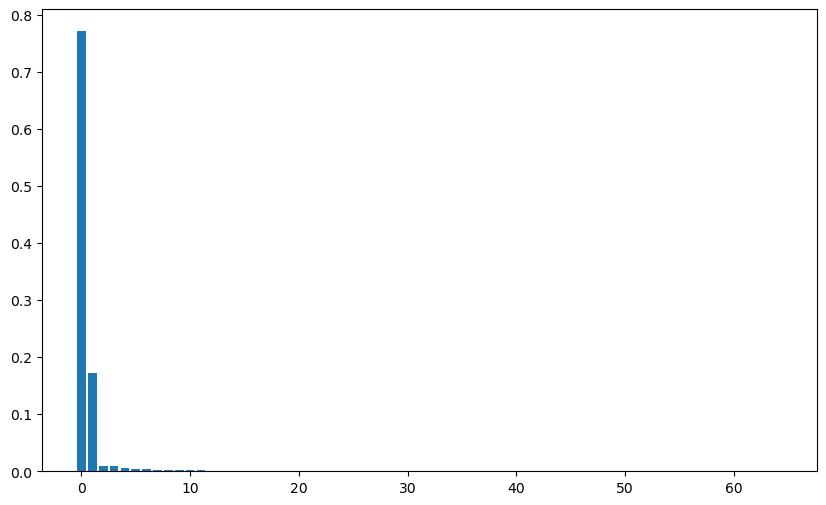

In [101]:
#elbow plot
fig, ax = plt.subplots(figsize = (10,6))

ax.bar(range(0,len(explained_variance),1),explained_variance)

In [110]:
numb_components_pca = 0.99
pca = PCA(n_components=numb_components_pca)
y_train = datesIDnsr['ptID']
X_train_pca = pca.fit_transform(X_train)
explained_variance = pca.explained_variance_ratio_

<BarContainer object of 15 artists>

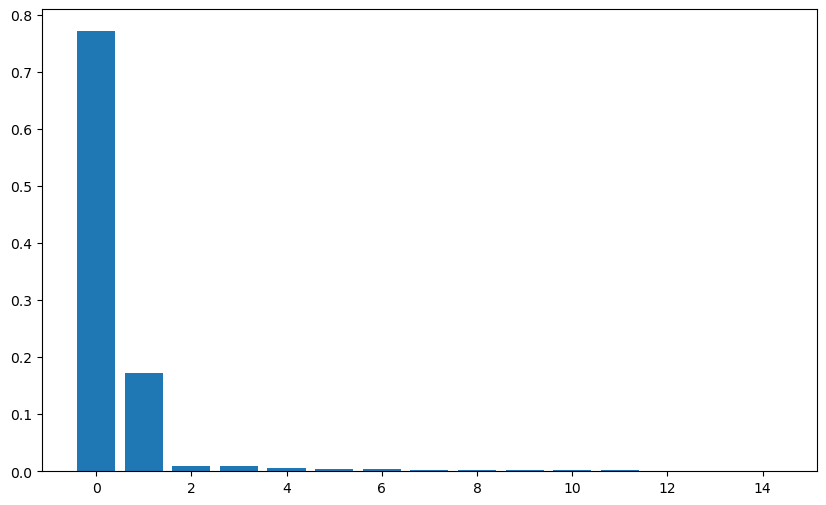

In [111]:
#elbow plot
fig, ax = plt.subplots(figsize = (10,6))

ax.bar(range(0,len(explained_variance),1),explained_variance)

<Axes: >

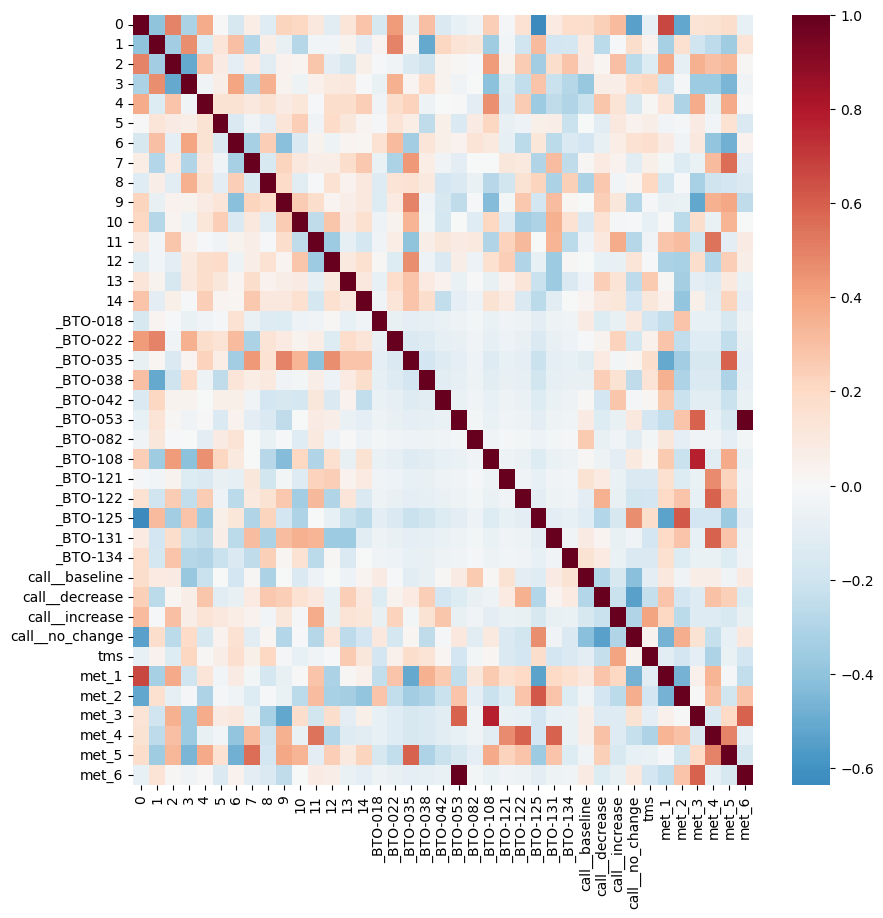

In [112]:
PCA_Heatmap = pd.DataFrame(X_train_pca)
# include all of the optional assigned labels
PCA_Heatmap = pd.concat((PCA_Heatmap, pd.get_dummies(y_train_df['ptID'], prefix='', drop_first=False), pd.get_dummies(y_train_nsr['nsrv2_call'], prefix='call_', drop_first=False), y_train_tms, y_train_mets), axis = 1)

PCA_Heatmap_nom = PCA_Heatmap

PCA_Heatmap_nom
fig, ax = plt.subplots(figsize = (10,10))

sns.heatmap(PCA_Heatmap_nom.corr(method ='spearman'), cmap = 'RdBu_r', center = 0, ax = ax)

# PCA back projection

In [118]:
weight_cutoff = 0.90
top_features = []
top_features_pca = []
for f in range(len(explained_variance)):
    norm_weight = abs(pca.components_[f,:])/sum(abs(pca.components_[f,:]))
    pca_feats = list(np.where(norm_weight > weight_cutoff*max(norm_weight))[0])
    
    top_features += pca_feats
    top_features_pca += [f]*len(pca_feats)
    
top_feat_table = pd.DataFrame({"pca": top_features_pca,"feat":top_features})
top_features = np.unique(np.array(top_features))

top_feats_pca_1 = top_feat_table.query('pca == 0').feat.values

In [119]:
# weight_cutoff = 0.70
# top_features = []
# top_features_pca = []
# for f in range(numb_components_pca):
#     norm_weight = abs(pca.components_[f,:])/sum(abs(pca.components_[f,:]))
#     pca_feats = list(np.where(norm_weight > weight_cutoff*max(norm_weight))[0])
    
#     top_features += pca_feats
#     top_features_pca += [f]*len(pca_feats)
    
# top_feat_table = pd.DataFrame({"pca": top_features_pca,"feat":top_features})
# top_features = np.unique(np.array(top_features))

# top_feats_pca_1 = top_feat_table.query('pca == 0').feat.values

In [120]:
X_train_df_topfeats = X_train_df.iloc[:,top_features]
X_train_df_topfeats.index = y_train_newindex
X_train_df_topfeats

,10_q11.21_12,12_p12.1_6,6_q21_8,18_q21.1_10,12_q21.1_11,11_q24.3_14,8_q24.22_6,10_q24.2_15,3_q26.31_2,12_p12.1_13,8_q22.1_34,13_q12.2_17,7_q22.1_45,5_q14.3_16
0,0.168560,0.416694,0.321444,0.000000,0.520617,-0.000837,0.743443,3.399353,0.565033,0.012499,-0.001960,0.350875,0.305462,-2.021846e-04
1,0.253196,0.000000,-0.002587,-0.004208,0.388238,0.346733,2.351429,-0.001057,2.584359,-0.004211,0.867272,0.835531,-0.034847,3.074170e-01
2,-0.033191,0.000000,0.152244,0.000000,0.668128,-0.000762,0.868392,0.945303,-0.086460,1.009503,-0.002592,3.192892,3.858861,-3.070612e-06
3,115.362434,269.034992,20.966653,53.872289,74.388248,3.089246,41.655457,52.712107,21.414723,320.036478,17.283175,0.221724,105.625179,6.241852e+01
4,37.594445,115.122837,12.302774,24.300671,26.092929,2.529751,10.405158,22.419319,14.542997,123.888280,4.074865,0.793358,42.157986,3.181918e+01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,15.435593,1.226396,3.693266,0.726224,1.620225,6.275985,0.623931,9.642327,13.688055,4.860774,8.550882,9.905442,4.355432,2.123867e+00
61,18.779486,3.269409,2.747658,0.406003,2.747428,3.745039,1.482264,9.508623,9.561850,-0.038044,8.762635,2.094330,7.189549,-2.535891e-15
62,7.026732,2.783741,0.894724,1.346055,2.603856,3.661499,-0.148787,11.868395,11.017054,0.440195,2.342094,5.544339,2.569462,8.776240e-01
63,0.063854,7.844934,8.149716,2.835546,7.634441,-0.000481,8.674381,14.012136,49.323142,11.132165,2.077649,5.741704,14.500537,2.220077e-01


In [121]:
#heat map of the new components

<Axes: >

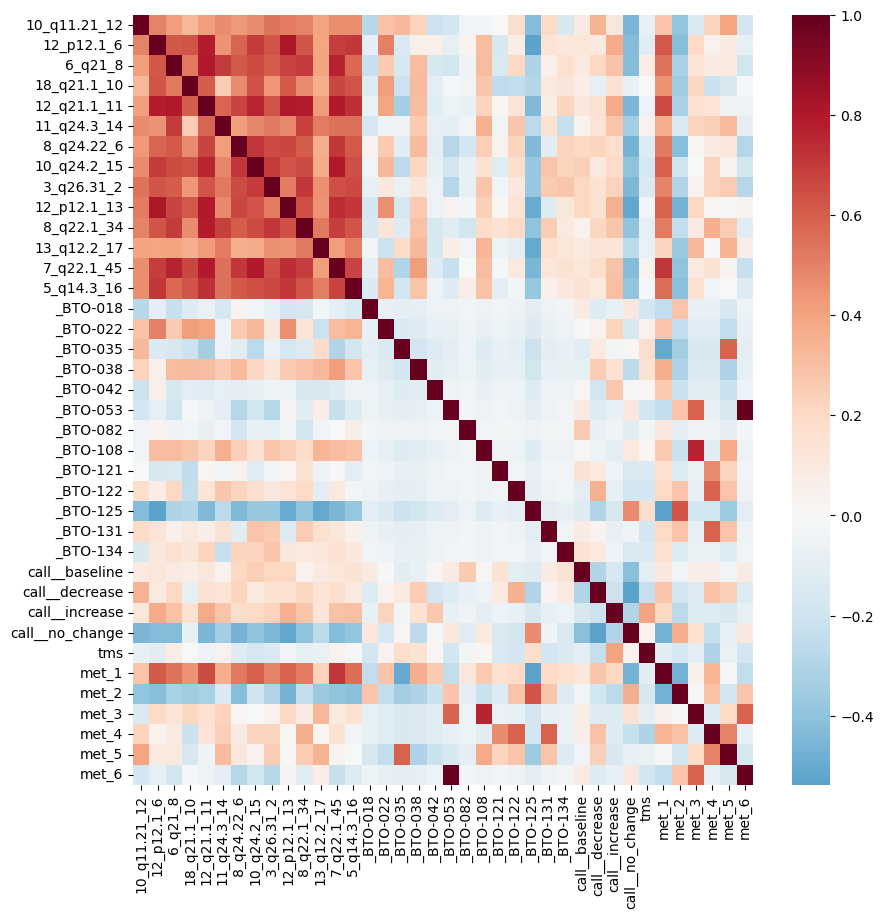

In [122]:
PCAP_ogfeats_Heatmap = pd.concat((X_train_df_topfeats,
                                  pd.get_dummies(y_train_df['ptID'], prefix='', drop_first=False), 
                                  pd.get_dummies(y_train_nsr['nsrv2_call'], prefix='call_', drop_first=False),
                                    y_train_tms, y_train_mets), axis = 1)


fig, ax = plt.subplots(figsize = (10,10))

sns.heatmap(PCAP_ogfeats_Heatmap.corr(method ='spearman'), cmap = 'RdBu_r', center = 0, ax = ax)

# Neighborhoods and louvain

In [147]:
metric_type = 'manhattan'

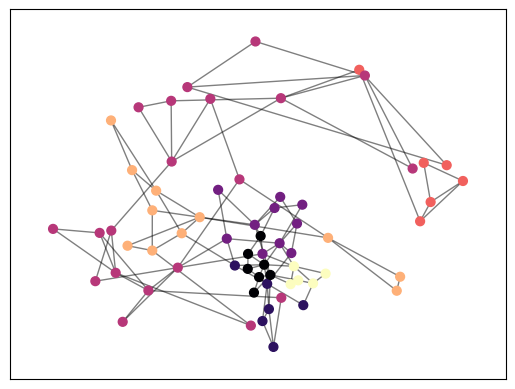

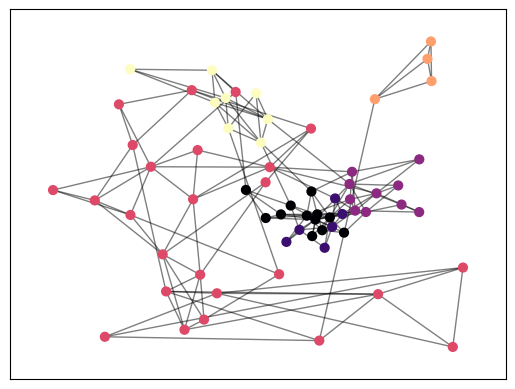

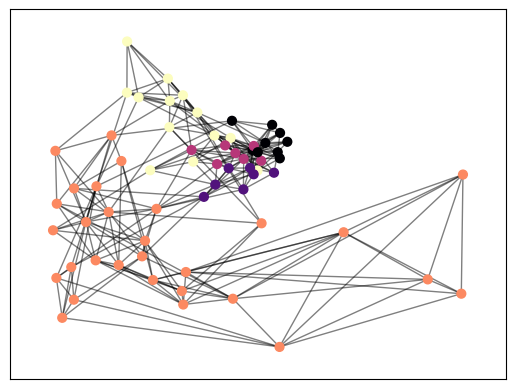

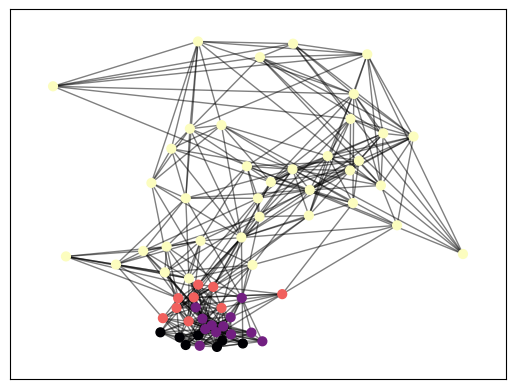

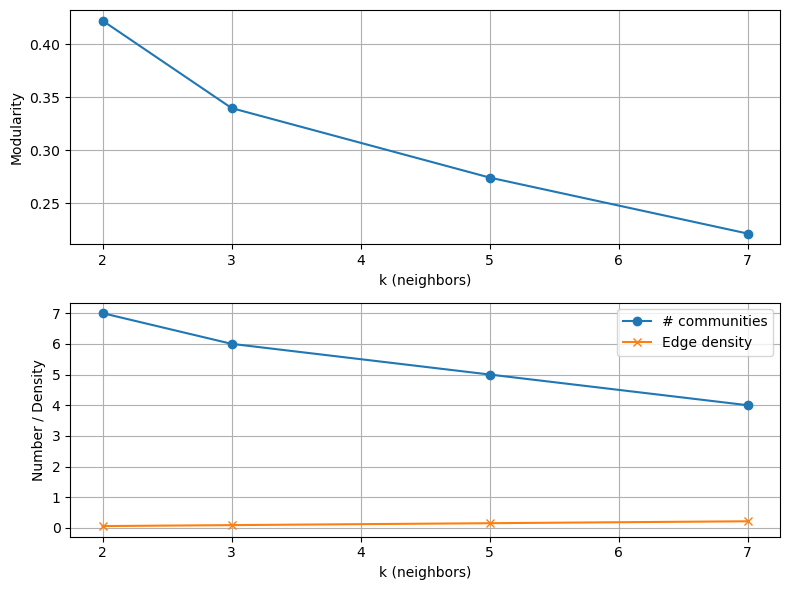

In [148]:
# “k_candidates” – pick a range that seems reasonable for your data size
k_candidates = [ 2, 3, 5, 7]

# Containers for metrics
modularity = []
edge_density = []     # edges / (n * (n-1) / 2)
num_comms   = []      # number of distinct communities
connectedness = []   # 1 if graph is fully connected, else 0

labels_louvain_dict = {}
ari_value = []
mi_value = []

for k in k_candidates:
    # 1) Build the k‑NN graph (symmetric, weighted)
    nn = NearestNeighbors(n_neighbors=k, algorithm= 'auto', metric = metric_type)
    nn.fit(X_train_df_topfeats)
    distances, indices = nn.kneighbors()

    rows, cols, data = [], [], []
    for i, (d, idx) in enumerate(zip(distances, indices)):
        rows.extend([i] * k)
        cols.extend(idx)              # the k neighbours of node i
        data.extend(1 / (d + 1e-8))   # small epsilon to avoid division by 0

    adj_mat = np.vstack((rows, cols, data)).astype(float).T

        # 1. Extract row, col, and data from the triplet array
    rows = adj_mat[:, 0].astype(int)
    cols = adj_mat[:, 1].astype(int)
    data = adj_mat[:, 2]

    # 2. Build a COO (coordinate) matrix and then convert to CSR
    adj_coo = sparse.coo_matrix((data, (rows, cols)),
                            shape=(X_train_df_topfeats.shape[0],
                                    X_train_df_topfeats.shape[0]))

    # 3. Optionally convert to CSR, which NetworkX prefers
    adj_csr = adj_coo.tocsr()

    # 4. Feed into NetworkX
    G = nx.from_scipy_sparse_array(adj_csr)

    # 2) Grow a NetworkX graph and run Louvain
    # G = nx.from_scipy_sparse_array(mat)
    partition = community_louvain.best_partition(G, weight='weight', random_state=0)
    labels_louvain = np.array([partition[w] for w in range(len(partition))])
    labels_louvain_dict[k] = labels_louvain
    comm_labels = np.array([partition[z] for z in range(G.number_of_nodes())])

    # 3) Diagnostics
    modularity.append(community_louvain.modularity(partition, G, weight='weight'))
    edge_density.append(adj_csr.nnz / (len(G) * (len(G) - 1) / 2))
    num_comms.append(len(set(comm_labels)))
    connectedness.append(1 if nx.is_connected(G) else 0)

    ari_value.append(adjusted_rand_score(y_train_df['ptID'], labels_louvain))
    mi_value.append(mutual_info_score(y_train_df['ptID'], labels_louvain))

    #plotting dendrogram
    pos = nx.spring_layout(G)
    nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                        cmap='magma', node_color=list(partition.values()))
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    plt.show()

# Plotting the trade‑off
fig, ax = plt.subplots(2, 1, figsize=(8, 6))
ax[0].plot(k_candidates, modularity, marker='o')
ax[0].set_xlabel('k (neighbors)')
ax[0].set_ylabel('Modularity')
ax[0].grid(True)

ax[1].plot(k_candidates, num_comms, marker='o', label='# communities')
ax[1].plot(k_candidates, edge_density, marker='x', label='Edge density')
ax[1].set_xlabel('k (neighbors)')
ax[1].set_ylabel('Number / Density')
ax[1].legend()
ax[1].grid(True)

plt.tight_layout()
plt.show()

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:328: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\mae

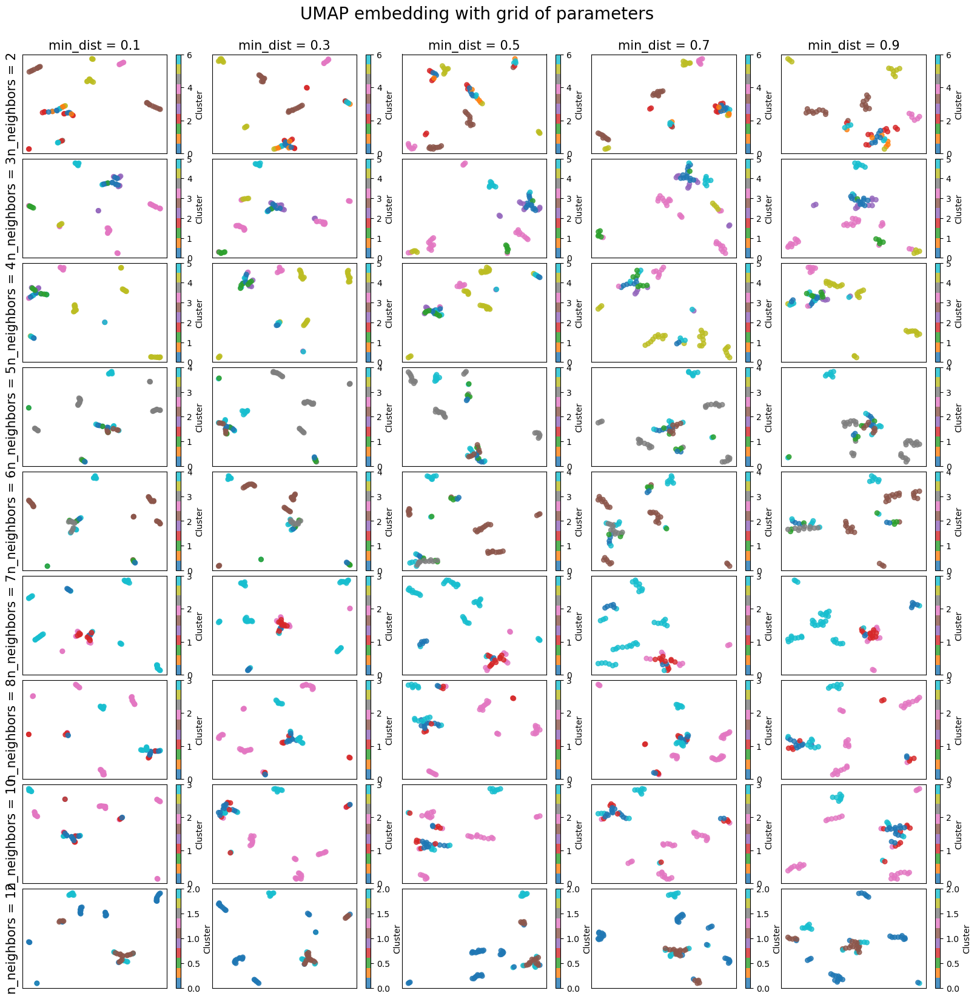

In [149]:
min_dist_values = [0.1, 0.3, 0.5, 0.7, 0.9]
k_candidates = [2,3, 4, 5, 6, 7, 8 , 10, 12]

labels_louvain_dict ={}

fig, axs = plt.subplots(  len(k_candidates), len(min_dist_values), figsize = (20,20))

for row, ax_row in enumerate(axs):
    for column, ax in enumerate(ax_row):
        k = k_candidates[row]
        min_dist_val = min_dist_values[column]

        # 1) Build the k‑NN graph (symmetric, weighted)
        nn = NearestNeighbors(n_neighbors=k, algorithm= 'auto', metric = metric_type)
        nn.fit(X_train_df_topfeats)
        distances, indices = nn.kneighbors()

        rows, cols, data = [], [], []
        for i, (d, idx) in enumerate(zip(distances, indices)):
            rows.extend([i] * k)
            cols.extend(idx)              # the k neighbours of node i
            data.extend(1 / (d + 1e-8))   # small epsilon to avoid division by 0

        adj_mat = np.vstack((rows, cols, data)).astype(float).T

            # 1. Extract row, col, and data from the triplet array
        rows = adj_mat[:, 0].astype(int)
        cols = adj_mat[:, 1].astype(int)
        data = adj_mat[:, 2]

        # 2. Build a COO (coordinate) matrix and then convert to CSR
        adj_coo = sparse.coo_matrix((data, (rows, cols)),
                                shape=(X_train_df_topfeats.shape[0],
                                        X_train_df_topfeats.shape[0]))

        # 3. Optionally convert to CSR, which NetworkX prefers
        adj_csr = adj_coo.tocsr()

        # 4. Feed into NetworkX
        G = nx.from_scipy_sparse_array(adj_csr)

        # 2) Grow a NetworkX graph and run Louvain
        # G = nx.from_scipy_sparse_array(mat)
        partition = community_louvain.best_partition(G, weight='weight', random_state=0)
        labels_louvain = np.array([partition[w] for w in range(len(partition))])
        labels_louvain_dict[k, min_dist_val] = labels_louvain
        comm_labels = np.array([partition[z] for z in range(G.number_of_nodes())])


        umap_embed = umap.UMAP(n_neighbors=2, min_dist=min_dist_val, random_state=0)
        X_umap = umap_embed.fit_transform(X_train_df_topfeats)

        scatter = ax.scatter(X_umap[:, 0], X_umap[:, 1],
                c=labels_louvain, cmap='tab10', s=30, alpha=0.8)
        plt.colorbar(scatter, label='Cluster')
        ax.set_xticks([])
        ax.set_yticks([])
        if row == 0:
            ax.set_title("min_dist = {}".format(min_dist_val), size=15)
        if column == 0:
            ax.set_ylabel("n_neighbors = {}".format(k), size=15)

fig.suptitle("UMAP embedding with grid of parameters", y=0.92, size=20)
plt.subplots_adjust(wspace=0.05, hspace=0.05)



## correlation heatmap

In [150]:
labels_louvain = labels_louvain_dict[5,0.7]
labels_louvain

array([0, 0, 4, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 0, 4, 4, 4, 3, 3,
       3, 3, 1, 1, 1, 3, 3, 0, 2, 0, 3, 3, 4, 4, 1, 1, 3, 3, 3, 3, 3, 3,
       1, 3, 3, 3, 2, 0, 0, 2, 1, 0, 4, 2, 2, 2, 0, 2, 3, 3, 3, 3, 3])

<Axes: >

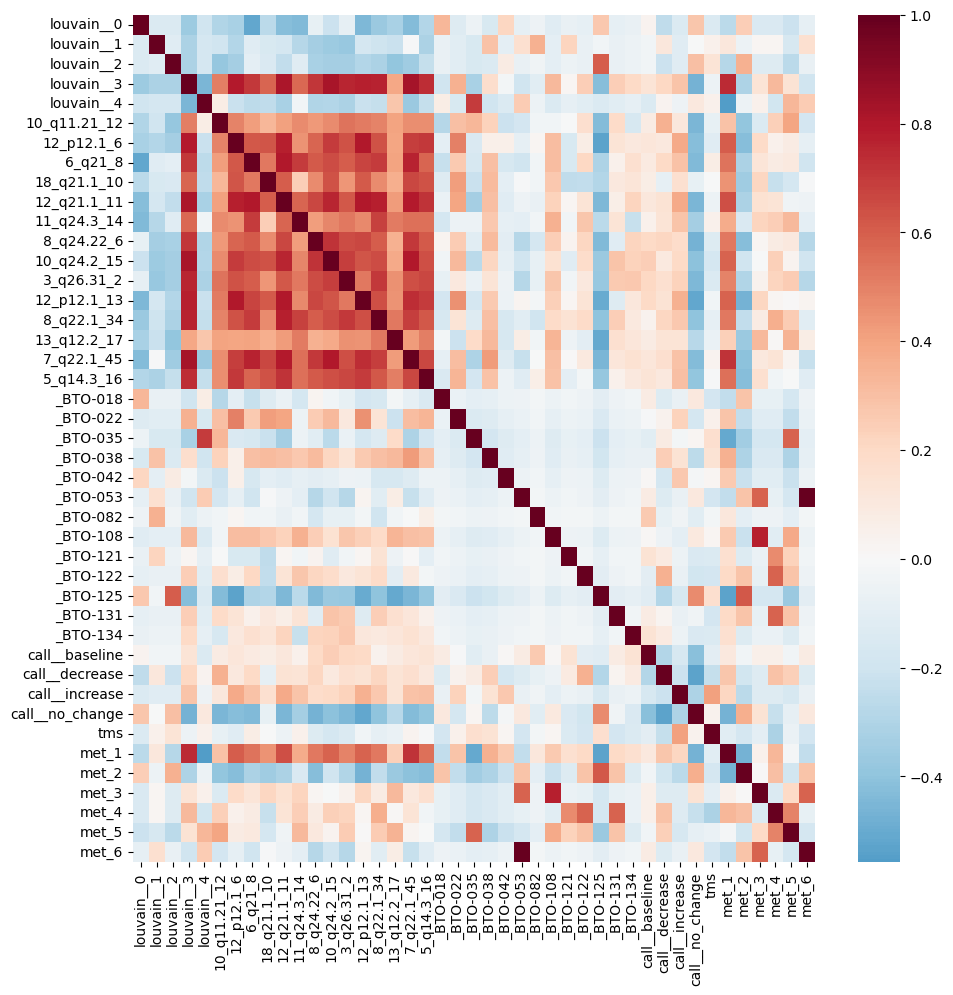

In [151]:
PCAP_ogfeats_Heatmap = pd.concat((pd.get_dummies(pd.DataFrame(labels_louvain, columns= ['Louvain'])['Louvain'], prefix='louvain_', drop_first=False),
                                  X_train_df_topfeats,
                                  pd.get_dummies(y_train_df['ptID'], prefix='', drop_first=False), 
                                  pd.get_dummies(y_train_nsr['nsrv2_call'], prefix='call_', drop_first=False),
                                  y_train_tms, y_train_mets), axis = 1)


fig, ax = plt.subplots(figsize = (11,11))

sns.heatmap(PCAP_ogfeats_Heatmap.corr(method ='spearman'), cmap = 'RdBu_r', center = 0, ax = ax)

# supervised UMAP using the back features form PCA

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score

In [159]:
le = LabelEncoder()
# PCA_rbf_Heatmap_nom = PCA_rbf_Heatmap
# PCA_rbf_Heatmap_nom['nsrv2_call_nom'] = le.fit_transform(PCA_rbf_Heatmap_nom['nsrv2_call'])
# PCA_rbf_Heatmap_nom['ptID_nom'] = le.fit_transform(PCA_rbf_Heatmap_nom['ptID'])
# PCA_rbf_Heatmap_nom.drop(['ptID','nsrv2_call'], axis = 1, inplace = True)

le.fit_transform(y_train_nsr['nsrv2_call'])

array([0, 3, 3, 0, 1, 1, 3, 2, 2, 0, 1, 1, 2, 1, 1, 3, 3, 3, 3, 3, 0, 1,
       1, 1, 1, 3, 1, 2, 2, 0, 3, 3, 2, 2, 0, 3, 3, 0, 0, 3, 3, 1, 3, 0,
       1, 1, 1, 1, 0, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 1, 3, 0, 1])

In [235]:
y_train_mets.shape

(65, 6)

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Text(0.5, 1.0, 'ptID')

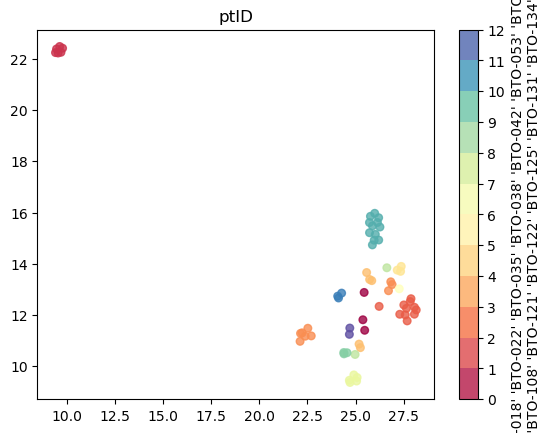

In [236]:

dictTargets = {
                'ptID': y_train_df['ptID'], 
               'nsrv2_call': y_train_nsr['nsrv2_call'], 
               'tms': y_train_tms
            #    ,'mets': y_train_mets
               }

target = 'ptID'

fig, ax = plt.subplots()

le = LabelEncoder()
y_target = dictTargets[target]
# column = y_target.columns()
y_target_nom = le.fit_transform(y_target)
classes = le.classes_
umap_embedding = umap.UMAP(random_state=0).fit_transform(X_train_df_topfeats, y=y_target_nom)
scatter = ax.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=y_target_nom, cmap='Spectral', s=30, alpha=0.8)
plt.colorbar(scatter, label = classes, boundaries = np.arange(len(classes))).set_ticks(range(len(classes)))
# ax.set_xticks([])
# ax.set_yticks([])
ax.set_title(target)

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Text(0.5, 1.0, 'nsrv2_call')

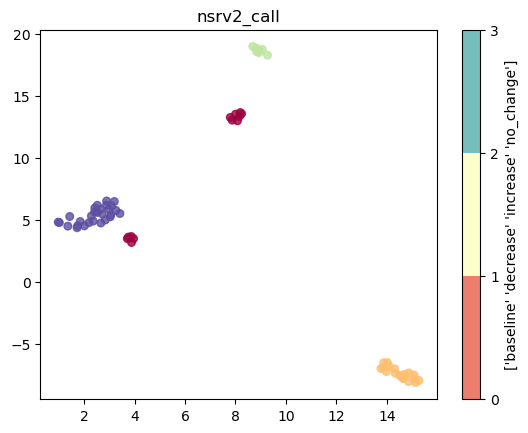

In [228]:

dictTargets = {
                'ptID': y_train_df['ptID'], 
               'nsrv2_call': y_train_nsr['nsrv2_call'], 
               'tms': y_train_tms
            #    ,'mets': y_train_mets
               }

target = 'nsrv2_call'

fig, ax = plt.subplots()

le = LabelEncoder()
y_target = dictTargets[target]
# column = y_target.columns()
y_target_nom = le.fit_transform(y_target)
classes = le.classes_
umap_embedding = umap.UMAP(random_state=0).fit_transform(X_train_df_topfeats, y=y_target_nom)
scatter = ax.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=y_target_nom, cmap='Spectral', s=30, alpha=0.8)
plt.colorbar(scatter, label = classes, boundaries = np.arange(len(classes))).set_ticks(range(len(classes)))
# ax.set_xticks([])
# ax.set_yticks([])
ax.set_title(target)

In [230]:
what = umap.UMAP(random_state=0).fit(X_train_df_topfeats, y=y_target_nom)

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\preprocessing\_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


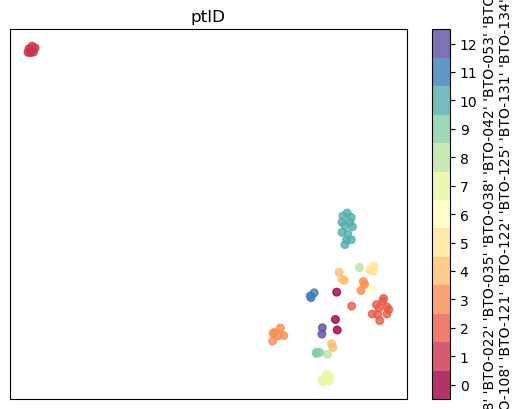

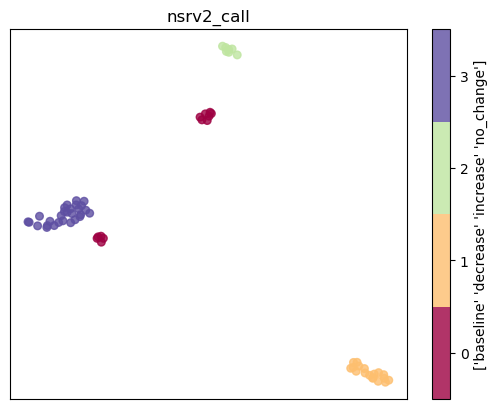

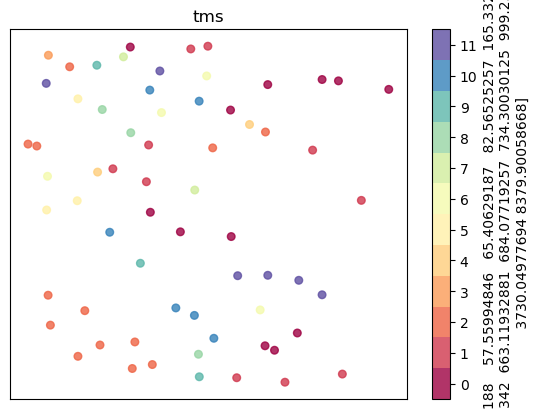

In [219]:
dictTargets = {
                'ptID': y_train_df['ptID'], 
               'nsrv2_call': y_train_nsr['nsrv2_call'], 
               'tms': y_train_tms
            #    ,'mets': y_train_mets
               }
# fig, ax = plt.subplots(1, len(dictTargets.keys()))
# umap_reducer = umap.UMAP()
# umap_embedding = umap_reducer.fit_transform(X_train_df_topfeats)
# fig_col = 0
for target in dictTargets.keys():
    fig, ax = plt.subplots()
    le = LabelEncoder()
    y_target = dictTargets[target]
    # column = y_target.columns()
    y_target_nom = le.fit_transform(y_target)
    classes = le.classes_
    umap_embedding = umap.UMAP(random_state=0).fit_transform(X_train_df_topfeats, y=y_target_nom)
    scatter = ax.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=y_target_nom, cmap='Spectral', s=30, alpha=0.8)
    plt.colorbar(scatter, label = classes, boundaries = np.arange(len(classes)+1)-0.5).set_ticks(np.arange(len(classes)))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(target)


c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\preprocessing\_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


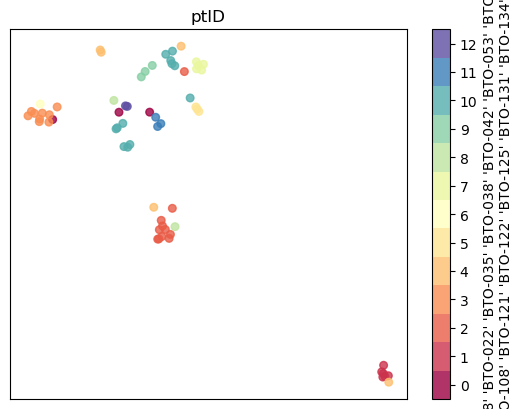

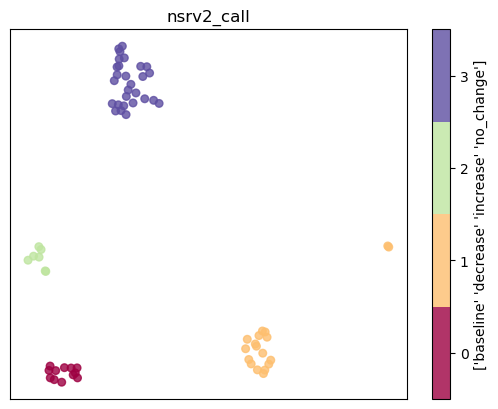

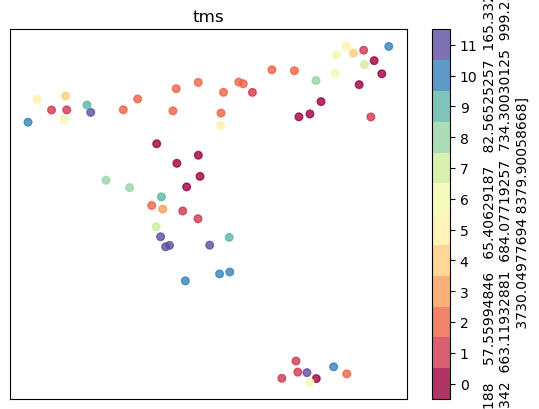

In [251]:
dictTargets = {
                'ptID': y_train_df['ptID'], 
               'nsrv2_call': y_train_nsr['nsrv2_call'], 
               'tms': y_train_tms
            #    ,'mets': y_train_mets
               }
# fig, ax = plt.subplots(1, len(dictTargets.keys()))
# umap_reducer = umap.UMAP()
# umap_embedding = umap_reducer.fit_transform(X_train_df_topfeats)
# fig_col = 0
for target in dictTargets.keys():
    fig, ax = plt.subplots()
    le = LabelEncoder()
    y_target = dictTargets[target]
    # column = y_target.columns()
    y_target_nom = le.fit_transform(y_target)
    classes = le.classes_
    umap_embedding = umap.UMAP(random_state=0, metric = 'cosine').fit_transform(X_train_df_topfeats, y=y_target_nom)
    scatter = ax.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=y_target_nom, cmap='Spectral', s=30, alpha=0.8)
    plt.colorbar(scatter, label = classes, boundaries = np.arange(len(classes)+1)-0.5).set_ticks(np.arange(len(classes)))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(target)


# Supervised UMAP full feature space

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\preprocessing\_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


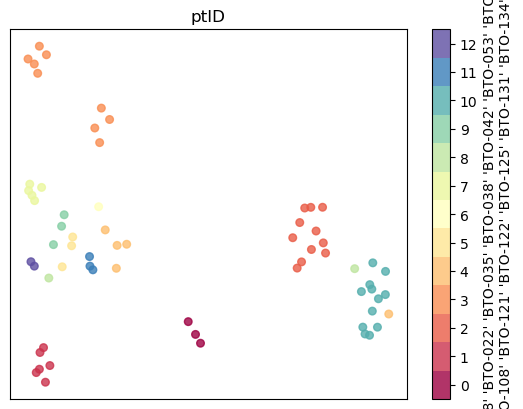

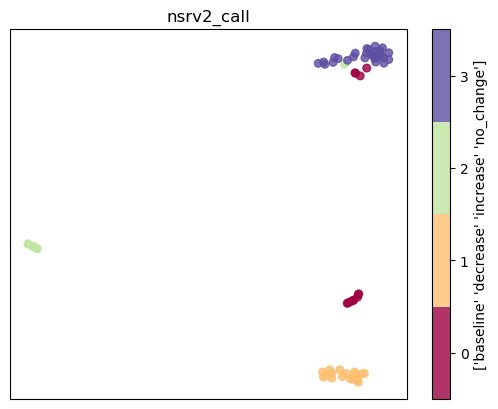

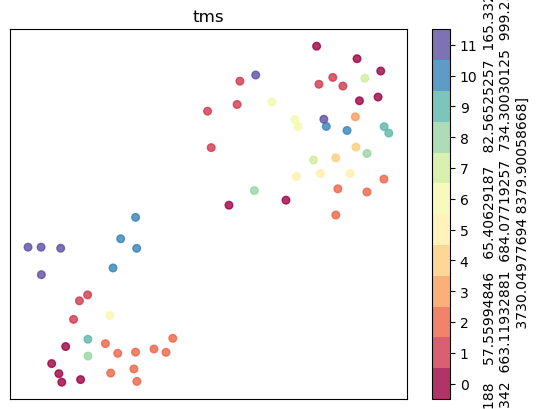

In [238]:
dictTargets = {
                'ptID': y_train_df['ptID'], 
               'nsrv2_call': y_train_nsr['nsrv2_call'], 
               'tms': y_train_tms
            #    ,'mets': y_train_mets
               }
# fig, ax = plt.subplots(1, len(dictTargets.keys()))
# umap_reducer = umap.UMAP()
# umap_embedding = umap_reducer.fit_transform(X_train_df_topfeats)
# fig_col = 0
for target in dictTargets.keys():
    fig, ax = plt.subplots()
    le = LabelEncoder()
    y_target = dictTargets[target]
    # column = y_target.columns()
    y_target_nom = le.fit_transform(y_target)
    classes = le.classes_
    umap_embedding = umap.UMAP(random_state=0).fit_transform(X_train_df, y=y_target_nom)
    scatter = ax.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=y_target_nom, cmap='Spectral', s=30, alpha=0.8)
    plt.colorbar(scatter, label = classes, boundaries = np.arange(len(classes)+1)-0.5).set_ticks(np.arange(len(classes)))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(target)


c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\preprocessing\_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


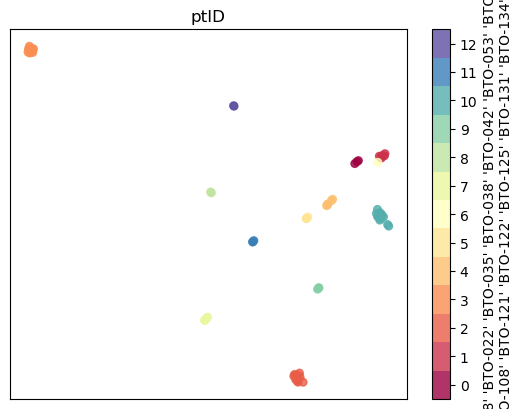

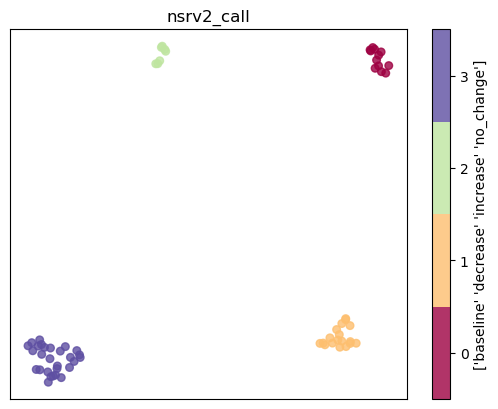

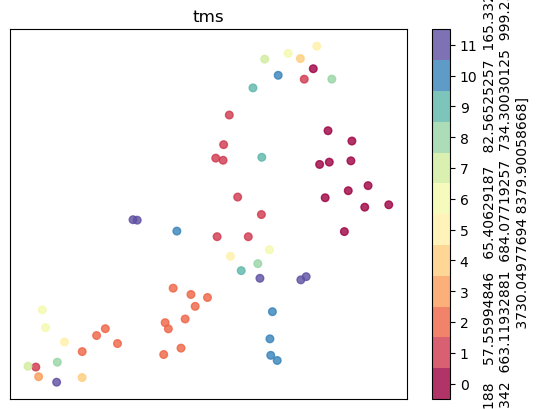

In [244]:
dictTargets = {
                'ptID': y_train_df['ptID'], 
               'nsrv2_call': y_train_nsr['nsrv2_call'], 
               'tms': y_train_tms
            #    ,'mets': y_train_mets
               }
# fig, ax = plt.subplots(1, len(dictTargets.keys()))
# umap_reducer = umap.UMAP()
# umap_embedding = umap_reducer.fit_transform(X_train_df_topfeats)
# fig_col = 0
for target in dictTargets.keys():
    fig, ax = plt.subplots()
    le = LabelEncoder()
    y_target = dictTargets[target]
    # column = y_target.columns()
    y_target_nom = le.fit_transform(y_target)
    classes = le.classes_
    umap_embedding = umap.UMAP(random_state=0, metric='correlation').fit_transform(X_train_df, y=y_target_nom)
    scatter = ax.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=y_target_nom, cmap='Spectral', s=30, alpha=0.8)
    plt.colorbar(scatter, label = classes, boundaries = np.arange(len(classes)+1)-0.5).set_ticks(np.arange(len(classes)))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(target)


# supervised UMAP with x_train_pca

c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\sklearn\preprocessing\_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\maega\anaconda3\envs\BeatCancerLab\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


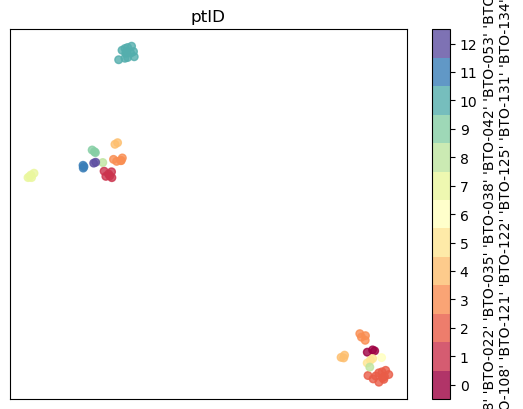

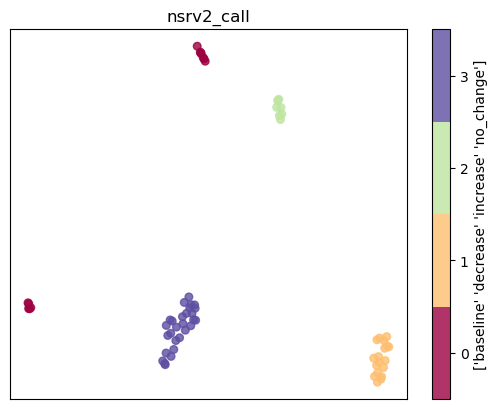

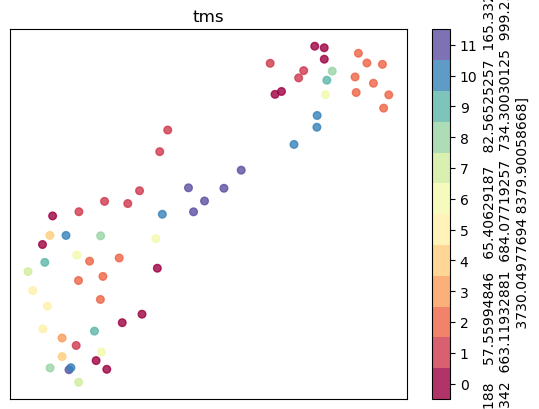

In [239]:
dictTargets = {
                'ptID': y_train_df['ptID'], 
               'nsrv2_call': y_train_nsr['nsrv2_call'], 
               'tms': y_train_tms
            #    ,'mets': y_train_mets
               }
# fig, ax = plt.subplots(1, len(dictTargets.keys()))
# umap_reducer = umap.UMAP()
# umap_embedding = umap_reducer.fit_transform(X_train_df_topfeats)
# fig_col = 0
for target in dictTargets.keys():
    fig, ax = plt.subplots()
    le = LabelEncoder()
    y_target = dictTargets[target]
    # column = y_target.columns()
    y_target_nom = le.fit_transform(y_target)
    classes = le.classes_
    umap_embedding = umap.UMAP(random_state=0).fit_transform(X_train_pca, y=y_target_nom)
    scatter = ax.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=y_target_nom, cmap='Spectral', s=30, alpha=0.8)
    plt.colorbar(scatter, label = classes, boundaries = np.arange(len(classes)+1)-0.5).set_ticks(np.arange(len(classes)))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(target)
